# Cross-Correlation

### Tag 5

In den letzten vier Tagen habe ich versucht, mithilfe der Autokorrelation zu analysieren, ob sich im Lied Für Elise von Beethoven ähnliche Muster erkennen lassen. Nun möchte ich einen anderen Ansatz verfolgen: Ich möchte untersuchen, ob die Anfangsmelodie trotz variierender Ausführung mithilfe der Kreuzkorrelation identifiziert werden kann. Dafür werde ich die ersten 10 Sekunden des Stücks extrahieren (der Teil, der sich mehrmals wiederholt, aber varriert wurde) und diese als Referenz verwenden, um alle ähnliche Muster in anderen Teilen des Liedes zu finden. Ziel ist es, die Robustheit der Kreuzkorrelation bei der Erkennung solcher Muster zu bewerten.

(Text wurde mit Perplexity bearbeitet)

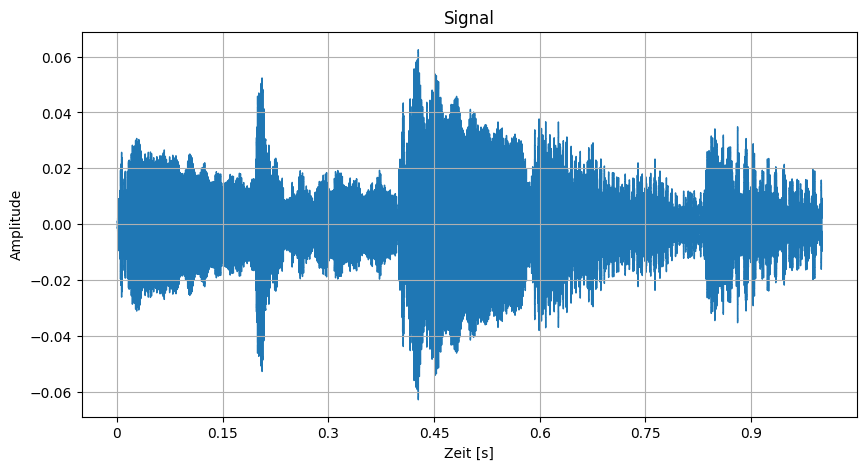

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

n, sr = librosa.load('Elise.mp3', sr=None)
n_part = n[48500:48500+44100] # 44100 samples = 1 Sekunde, insgesamt 10 Ssekunden

# Frequenzspektrum
plt.figure(figsize=(10, 5))
librosa.display.waveshow(n_part, sr=sr)
plt.title("Signal")
plt.xlabel("Zeit [s]")
plt.ylabel("Amplitude")
plt.grid(True)

plt.show()

## Tag 6

Ich werde mithilfe von Crosscorrelation versuchen, die Anfangsmelodie in dem Lied wiederzuerkennen. Ich habe nicht die ersten 10 Sekunden genommen, da am Anfang des Liedes keine Melodie ist, weshalb ich bei Index = 48500 (also bei Sekunde 2).

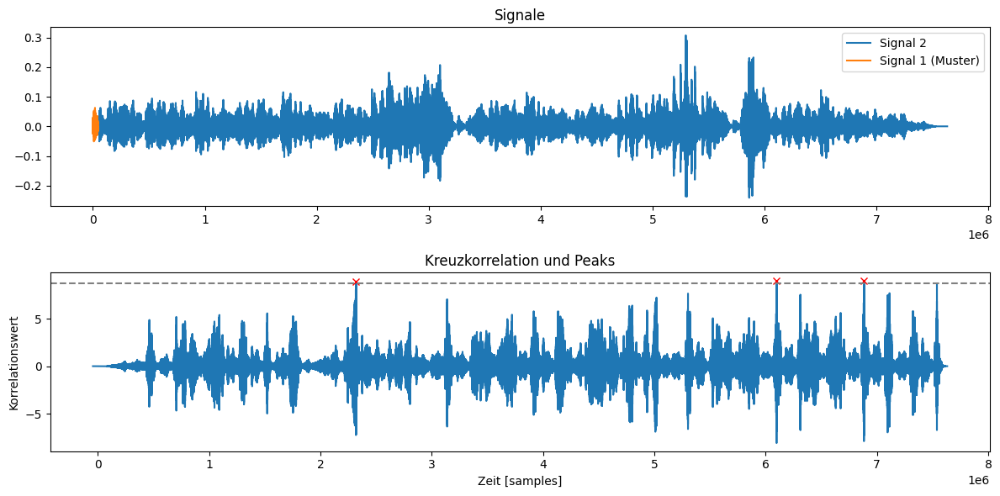

Signal 1 kommt 3 Mal in Signal 2 vor.


In [2]:
# cross correlation
from scipy.signal import correlate, find_peaks

corr = np.correlate(n_part, n, mode='full')
lags = np.arange(-len(n_part) + 1, len(n))  # Zeitverschiebungen berechnen

# Schwellenwert für Peaks setzen
threshold = 0.97 * np.max(corr)  # 80% des Maximums

# Peaks finden
samples_per_10s = sr * 5
peaks, properties = find_peaks(corr, height=threshold, distance=samples_per_10s)

# Zeitverschiebungen der Peaks extrahieren
peak_lags = lags[peaks]

# Visualisierung
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(n, label="Signal 2")
plt.plot(np.arange(50, 50 + len(n_part)), n_part, label="Signal 1 (Muster)")
plt.legend()
plt.title("Signale")

plt.subplot(2, 1, 2)
plt.plot(lags, corr, label="Kreuzkorrelation")
plt.plot(peak_lags, corr[peaks], 'rx', label="Peaks")
plt.axhline(y=threshold, color='gray', linestyle='--', label="Schwellenwert")
#plt.legend()
plt.title("Kreuzkorrelation und Peaks")
plt.xlabel("Zeit [samples]")
plt.ylabel("Korrelationswert")
plt.tight_layout()
plt.show()

# Anzahl der Übereinstimmungen
n_matches = len(peaks)
print(f"Signal 1 kommt {n_matches} Mal in Signal 2 vor.")

Im oberen Plot sieht man das Lied und eingezeichnet die Sequenz, welche ich ausgeschgnitten habe. Im unteren erkennt man die Kreuzkorrelation. Der Treshold wurde so gewählt, dass nur die höchsten Peaks angezeigt werden, ich habe ihn so hoch gesetzt, dass nur noch die Sequenzen als Peaks angezeigt werden, welche wirklich auch dem Signal entsprechen. Was mich jedoch erstaunt, ist, dass es am Anfang nicht auch noch einen Peak gibt, denn dort wird die Melodie rein akustisch wiederholt, der Korrelationswert leigt hier jedoch im Bereich von etwas unter 5. Da jedoch die Kreuzkorrelation sehr anfällig für Signalveränderungen ist, werde ich das nochmals probieren und normieren. (ich habe hier die Legende mal ausgeklammert, damit man den Bereich besser erkennt am Anfang, da die Legende sonst einfach sehr viel vom plot veredeckt)

In [3]:
# Peaks anhören 2 sekunden vorher und 10 sekunden nachher
from IPython.display import Audio, display

seconds_before_peak = 2  # 2 Sekunden vor dem Peak
seconds_after_peak = 10  # 10 Sekunden nach dem Peak

# Muster-Signal (n_part) abspielen
samples_before = int(seconds_before_peak * sr)
samples_after = int(seconds_after_peak * sr)

# Start- und Endindex für den erweiterten Bereich berechnen
start_index = max(0, 48500 - samples_before)
end_index = min(len(n), 48500 + 44100 + samples_after)

# Erweiterten Bereich extrahieren
n_part_extended = n[start_index:end_index]

# Abspielen des erweiterten Signals
print(f"Abspielen von n_part mit 2 Sekunden vorher und 10 Sekunden nachher:")
display(Audio(n_part_extended, rate=sr))  # Hier wird n_part als dein Vergleichssignal abgespielt

# Peaks bearbeiten
for i, peak in enumerate(peaks):
    # Sample-Bereiche berechnen
    start_sample = max(0, peak - seconds_before_peak * sr)
    end_sample = min(len(n), peak + seconds_after_peak * sr)

    # Signalbereich extrahieren
    extracted_signal = n[start_sample:end_sample]

    print(f"\nWiedergabe von Segment {i+1}:")
    display(Audio(extracted_signal, rate=sr))


Abspielen von n_part mit 2 Sekunden vorher und 10 Sekunden nachher:



Wiedergabe von Segment 1:



Wiedergabe von Segment 2:



Wiedergabe von Segment 3:


Die ausgewählten Signale hören sich sehr ähnlich an zu dem Ursprünglichen, es scheint also gut funktioniert zu haben, ausser, dass nicht alle Peaks gefunden wurden.

C:\Users\Michelle\AppData\Local\Temp\ipykernel_16192\2435131846.py:52: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\Michelle\Desktop\Uni\Code\bild-und-signalverarbeitung\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


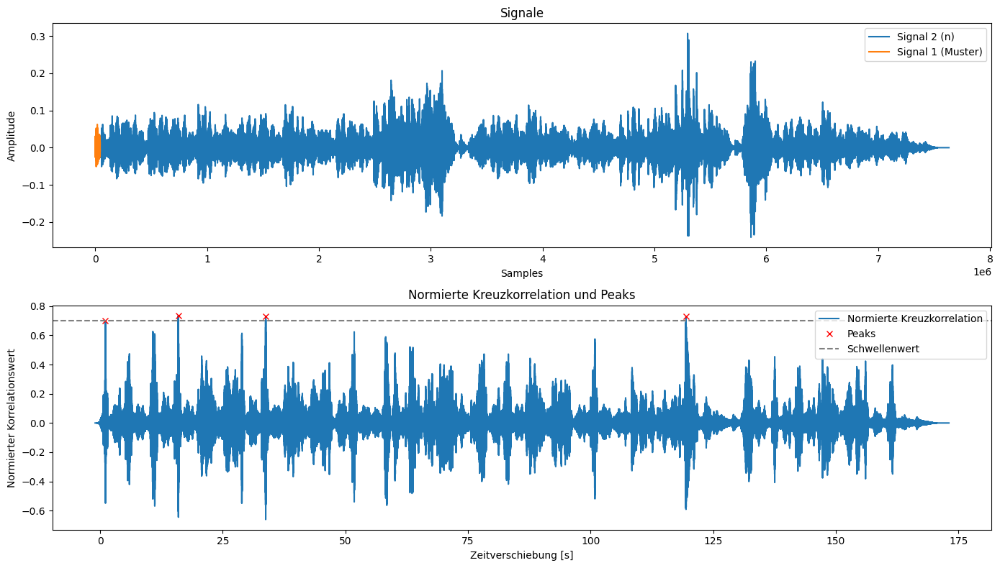

In [4]:
import numpy as np
from scipy.signal import correlate, find_peaks, correlation_lags
import matplotlib.pyplot as plt

# Zentrieren der Signale
n_part_centered = n_part - np.mean(n_part)
n_centered = n - np.mean(n)

# Standardabweichungen berechnen
std_n_part = np.std(n_part_centered)
std_n = np.std(n_centered)

# Normierte Kreuzkorrelation berechnen
corr_ = correlate(n_centered, n_part_centered, mode='full') / (std_n * std_n_part * len(n_part_centered))

# Zeitverschiebungen (Lags) berechnen
lags_ = correlation_lags(len(n), len(n_part), mode='full')

# Schwellenwert für Peaks setzen
threshold_ = 0.7 

# Peaks finden
samples_per_10s = sr * 5  # Mindestabstand von 5 Sekunden
peaks_, properties_ = find_peaks(corr_, height=threshold_, distance=samples_per_10s)

# Zeitverschiebungen der Peaks berechnen
peak_times = lags_[peaks_] / sr

# Visualisierung
plt.figure(figsize=(14, 8))

# Originalsignal und Muster
plt.subplot(2, 1, 1)
plt.plot(n, label="Signal 2 (n)")
plt.plot(np.arange(0, len(n_part)), n_part, label="Signal 1 (Muster)")
plt.legend()
plt.title("Signale")
plt.xlabel("Samples")
plt.ylabel("Amplitude")

# Normierte Kreuzkorrelation
plt.subplot(2, 1, 2)
plt.plot(lags_ / sr, corr_, label="Normierte Kreuzkorrelation")
plt.plot((lags_[peaks_]) / sr, corr_[peaks_], 'rx', label="Peaks")
plt.axhline(y=threshold_, color='gray', linestyle='--', label="Schwellenwert")
plt.xlabel("Zeitverschiebung [s]")
plt.ylabel("Normierter Korrelationswert")
plt.title("Normierte Kreuzkorrelation und Peaks")
plt.legend()

# Layout anpassen und anzeigen
plt.tight_layout()
plt.show()


In [5]:

seconds_before_peak = 2  # 2 Sekunden vor dem Peak
seconds_after_peak = 10  # 10 Sekunden nach dem Peak

# Muster-Signal (n_part) abspielen
samples_before = int(seconds_before_peak * sr)
samples_after = int(seconds_after_peak * sr)

# Start- und Endindex für den erweiterten Bereich berechnen
start_index = max(0, 48500 - samples_before)
end_index = min(len(n), 48500 + 44100 + samples_after)

# Erweiterten Bereich extrahieren
n_part_extended = n[start_index:end_index]

# Abspielen des erweiterten Signals
print(f"Abspielen von n_part mit 2 Sekunden vorher und 10 Sekunden nachher:")
display(Audio(n_part_extended, rate=sr))  # Hier wird n_part als dein Vergleichssignal abgespielt

# Peaks bearbeiten
for i, peak in enumerate(peaks_):
    # Sample-Bereiche berechnen
    start_sample = max(0, peak - seconds_before_peak * sr)
    end_sample = min(len(n), peak + seconds_after_peak * sr)

    # Signalbereich extrahieren
    extracted_signal = n[start_sample:end_sample]

    print(f"\nWiedergabe von Segment {i+1}:")
    display(Audio(extracted_signal, rate=sr))

Abspielen von n_part mit 2 Sekunden vorher und 10 Sekunden nachher:



Wiedergabe von Segment 1:



Wiedergabe von Segment 2:



Wiedergabe von Segment 3:



Wiedergabe von Segment 4:


Interessanterweise wird jetzt der Anfang sehr gut erkannt, jedoch wird diesmal das Ende sehr schlecht erkannt. Das könnte daran liegen, dass das Ende des Liedes sehr stark variiert wurde, weshalb die Kreuzkorrelation hier nicht mehr so gut funktioniert. Ausserdem finde ich den letzten peak sehr interessant, da er sehr hoch ist, jedoch akustisch nicht der Melodie entspricht. Durch die normierung wird die Lautstärke nicht mehr berücksichtigt, dies könnte also der Grund sein, warum es akustisch nicht passt.

## Tag 7

Um die Krosskorrelation besser bewerten zu können (nicht nur durch die akustik, welche nicht viel Aussagekraft hat), möchte ich die Peaks nochmal genauer untersuchen und bewerten. Ich werde dazu die Peaks mit der verglichenen Sequenz übereinanderlegen und schauen wie gut sie übereinstimmen.

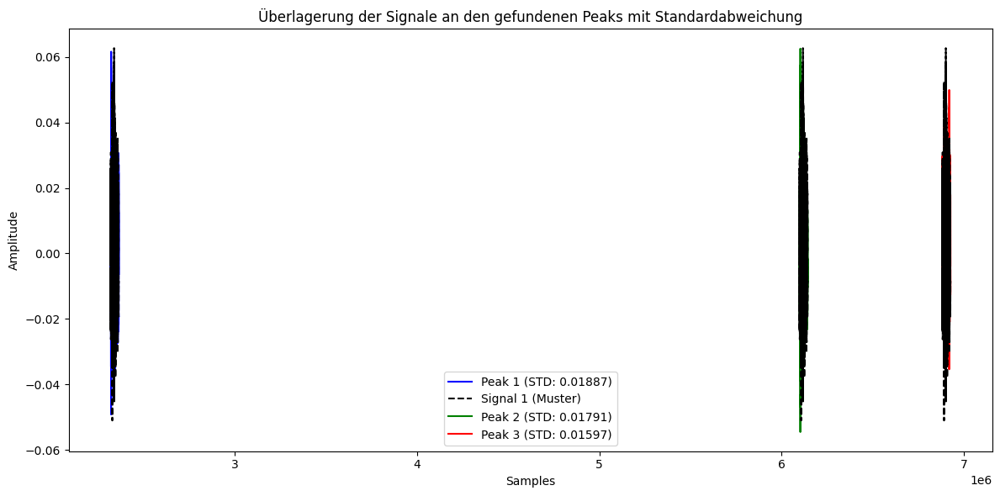

Standardabweichungen der Differenzen für jeden Peak:
Peak 1: 0.01887
Peak 2: 0.01791
Peak 3: 0.01597


In [6]:
# Überlagerung der Sequenz (unnormierte Kreuzkorrelation)
# Farben für Abschnitte definieren
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']  # Beliebige erweiterbare Farbpalette

# Sicherstellen, dass `peak_lags` in gültige Indizes umgerechnet wird
valid_peaks = [lag for lag in peak_lags if 0 <= lag < len(n)]  # Nur gültige Peaks behalten

# Liste zur Speicherung der Standardabweichungen
std_devs = []

# Visualisierung der Überlagerung für jeden gefundenen Abschnitt
plt.figure(figsize=(12, 6))

for i, peak in enumerate(valid_peaks):
    start = peak
    end = start + len(n_part)
    
    if end > len(n):  # Vermeide Bereiche, die über die Länge von Signal 2 hinausgehen
        continue
    
    # Abschnitt aus Signal 2 extrahieren
    section = n[start:end]
    
    # Differenz zwischen Muster und Abschnitt berechnen
    differences = section - n_part
    
    # Standardabweichung der Differenzen berechnen
    std_dev = np.std(differences)
    std_devs.append(std_dev)  # Speichern für späteren Überblick
    
    # Plot der Überlagerung
    plt.plot(np.arange(start, end), section, label=f"Peak {i+1} (STD: {std_dev:.5f})", color=colors[i % len(colors)])
    plt.plot(np.arange(start, end), n_part, label="Signal 1 (Muster)", color='black', linestyle='dashed')

# Legende bereinigen: Doppelte Einträge für das Muster entfernen
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Doppelte Einträge entfernen
plt.legend(by_label.values(), by_label.keys())

plt.title("Überlagerung der Signale an den gefundenen Peaks mit Standardabweichung")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

# Ausgabe der Standardabweichungen
print("Standardabweichungen der Differenzen für jeden Peak:")
for i, std_dev in enumerate(std_devs, 1):
    print(f"Peak {i}: {std_dev:.5f}")


Man erkennt hier in der Überlagerung sehr gut, dass alle drei Abschnitte sehr gut mit der Sequenz übereinstimmen. Alle haben etwa eine Standardabweichung von 0.01, dies ist sehr genau. Es bestätigt also meine akustische Annahme und das Modell hat hier drei passende Signale gefunden. Ich werde auch noch die normierte Überlagerung plotten und schauen wir sich vor allem der Peak 4 verhält, da dieser akustisch ja nicht gepasst hat.

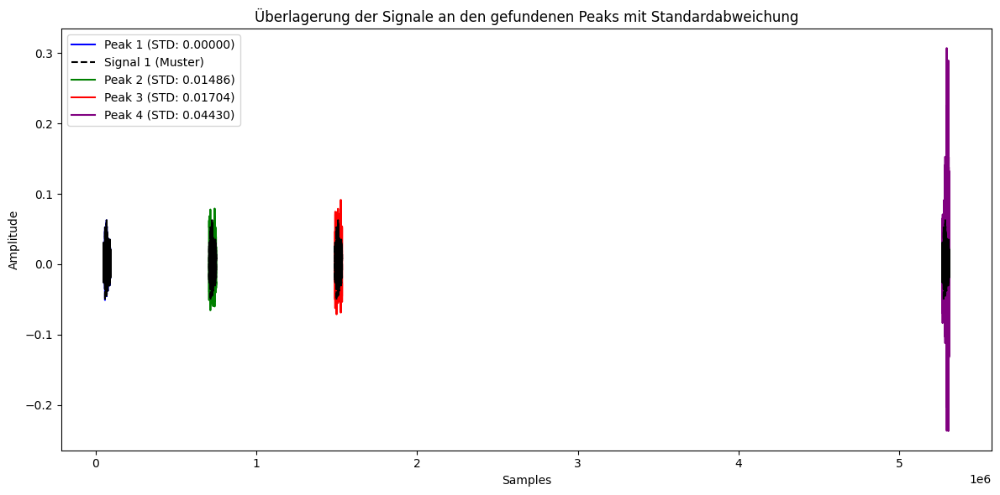

Standardabweichungen der Differenzen für jeden Peak:
Peak 1: 0.00000
Peak 2: 0.01486
Peak 3: 0.01704
Peak 4: 0.04430


In [7]:
# Überlagerung der Sequenz (normierte Kreuzkorrelation)
# Farben für Abschnitte definieren
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']  # Beliebige erweiterbare Farbpalette

# Sicherstellen, dass `lags_[peaks_]` in gültige Indizes umgerechnet wird
valid_peaks_ = [lag for lag in lags_[peaks_] if 0 <= lag < len(n)]  # Nur gültige Peaks behalten

# Liste zur Speicherung der Standardabweichungen
std_devs = []

# Visualisierung der Überlagerung für jeden gefundenen Abschnitt
plt.figure(figsize=(12, 6))

for i, peak in enumerate(valid_peaks_):
    start = int(peak)  # Peak-Index in Integer umwandeln
    end = start + len(n_part)

    if end > len(n):  # Vermeide Bereiche, die über die Länge von Signal 2 hinausgehen
        continue

    # Abschnitt aus Signal 2 extrahieren
    section = n[start:end]

    # Differenz zwischen Muster und Abschnitt berechnen
    differences = section - n_part

    # Standardabweichung der Differenzen berechnen
    std_dev = np.std(differences)
    std_devs.append(std_dev)  # Speichern für späteren Überblick

    # Plot der Überlagerung
    plt.plot(np.arange(start, end), section, label=f"Peak {i+1} (STD: {std_dev:.5f})", color=colors[i % len(colors)])
    plt.plot(np.arange(start, end), n_part, label="Signal 1 (Muster)", color='black', linestyle='dashed')

# Legende bereinigen: Doppelte Einträge für das Muster entfernen
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Doppelte Einträge entfernen
plt.legend(by_label.values(), by_label.keys())

plt.title("Überlagerung der Signale an den gefundenen Peaks mit Standardabweichung")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

# Ausgabe der Standardabweichungen
print("Standardabweichungen der Differenzen für jeden Peak:")
for i, std_dev in enumerate(std_devs, 1):
    print(f"Peak {i}: {std_dev:.5f}")

In dieser Überlagerung sieht die Korrelation etwa gleich aus, bis auf den letzten Peak. Der erste Peak hat sogar eine Standardabweichung von 0.00, was bedeutet, das diese perfekt übereinstimmen. Dies macht auch Sinn, denn die Sequenz wird am Anfang zweimal exakt gleich gespielt (kenne mich zwar nicht genau mit Noten aus aber ich meine es sind die gleichen Noten). Peak 2 und 3 sind auch sehr gut und somit sind diese drei Peaks noch eine Ergänzung zu den oberen drei Peaks. Der letzte ist jedoch wie zu erwarten etwas schlechter (0.04), jedoch ist dieser Wert rein von den Zahlen immer noch sehr genau zu dem Lied. Bei den normierten Werten wird die Lautstärke nicht merh berücksichtigt, weshalb wir hier zu anderen Ergebnissen kommen. Beide Modelle haben also sehr gut Predicted, jedoch wurden nicht alle Sequenzen gefunden. Dies bestätigt jedoch auch nur die Annahme, dass wir es hier mit der gleichen Grundmelodie zu tun haben, jedoch diese sehr stark variiert wurde.

### Tag 8

Da sich die Melodie während des Verlaufs verändert, beziehungsweise varriert ist es sinnvoll, die Anfangsmelodie ebenfalls etwas zu verändern und zu schauen, wie sich die Kreuzkorrelation verhält. 

Zum Beipspiel könnte man harmonische und rythmische Modifikationen vornehmen:
- harmonische Modifikationen: hinzufügen von Begleitakkorden, da Beethoven die Begleitakkorde oft in anderen Tonarten spielt. 
- rythmische Modifikationen: verändern der Notenlängen, da Beethoven die Notenlängen sehr oft variiert hat.

So könnte ich eventuell noch weitere Peaks finden, welche sich melodisch gleich anhören, momentan jedoch nicht gefunden wurden.

### Tag 9
Ich werde nun meinem ausgeschnittenen Signal Begleitakkorde hinzufügen und die Signale miteinander vergleichen.

In [8]:
# Begleitakkorde hinzufügen
import sounddevice as sd

# Lade das Signal
n, sr = librosa.load('Elise.mp3', sr=None)

# Schneide den gewünschten Teil aus (hier ein längerer Abschnitt, z. B. 10 Sekunden)
n_part = n[48500:48500 + sr * 10]  # 10 Sekunden bei sr=44100

# Funktion zum Erzeugen eines Tons
def generate_tone(frequency, duration, samplerate):
    t = np.linspace(0, duration, int(samplerate * duration), endpoint=False)
    return np.sin(2 * np.pi * frequency * t)

# Funktion zum Erzeugen eines Akkords
def generate_chord(frequencies, duration, samplerate):
    return sum(generate_tone(freq, duration, samplerate) for freq in frequencies)


# Akkorddefinitionen (in Hz)
chords = {
    "Am": [220.00, 261.63, 329.63],   # a-Moll: A, C, E
    "C": [261.63, 329.63, 392.00],    # C-Dur: C, E, G
    "E": [329.63, 415.30, 493.88]     # E-Dur: E, G#, B
}

# Akkordfolge und Dauer jedes Akkords (in Sekunden)
chord_progression = [("Am", 3), ("C", 3), ("E", 4)]

# Generiere das Akkordsignal
chord_signal = np.zeros(len(n_part))
current_sample = 0

for chord_name, duration in chord_progression:
    chord = generate_chord(chords[chord_name], duration, sr)
    samples = len(chord)
    if current_sample + samples > len(chord_signal):
        samples = len(chord_signal) - current_sample
    chord_signal[current_sample:current_sample + samples] += chord[:samples]
    current_sample += samples

# Normalisiere den Akkord, damit er ähnlich laut ist wie das Originalsignal
chord_signal = chord_signal / np.max(np.abs(chord_signal)) * np.max(np.abs(n_part))

# Kombiniere das Originalsignal mit dem Akkord
combined_signal = n_part + chord_signal

# Normalisiere das kombinierte Signal
combined_signal = combined_signal / np.max(np.abs(combined_signal))

# Abspielen
sd.play(combined_signal, sr)
sd.wait()

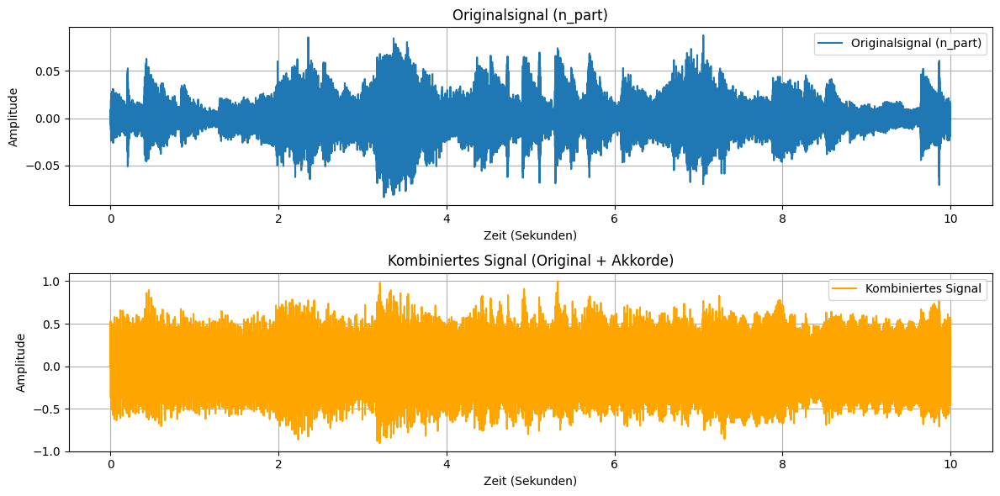

In [9]:
# Zeitachse für die Signale berechnen
time = np.linspace(0, len(n_part) / sr, len(n_part))

# Plot der Originalsignal-Ausschnitts (n_part)
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(time, n_part, label="Originalsignal (n_part)")
plt.title("Originalsignal (n_part)")
plt.xlabel("Zeit (Sekunden)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()

# Plot des kombinierten Signals (combined_signal)
plt.subplot(2, 1, 2)
plt.plot(time, combined_signal, label="Kombiniertes Signal", color="orange")
plt.title("Kombiniertes Signal (Original + Akkorde)")
plt.xlabel("Zeit (Sekunden)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()

# Zeige die Plots
plt.tight_layout()
plt.show()

Ich werde nun auch noch die wichtigen Kennzahlen vergleiche, um einen besseren Überblick über mein neues Signal zu bekommen.

In [10]:
# Kennzahlen vergleichen
import pandas as pd

def calculate_metrics(signal, name):
    max_amp = np.max(signal)
    min_amp = np.min(signal)
    mean_amp = np.mean(signal)
    std_dev = np.std(signal)
    energy = np.sum(signal**2)
    peak_to_avg_ratio = max_amp / np.sqrt(np.mean(signal**2))  # Peak-to-RMS
    
    return {
        "Signal": name,
        "Maximale Amplitude": max_amp,
        "Minimale Amplitude": min_amp,
        "Durchschnitt": mean_amp,
        "Standardabweichung": std_dev,
        "Energie": energy,
        "Spitzen-Amplituden-Verhältnis": peak_to_avg_ratio
    }

# Berechnung der Kennzahlen
metrics_n_part = calculate_metrics(n_part, "Originalsignal (n_part)")
metrics_combined = calculate_metrics(combined_signal, "Kombiniertes Signal")

metrics_df = pd.DataFrame([metrics_n_part, metrics_combined])
metrics_df

,Signal,Maximale Amplitude,Minimale Amplitude,Durchschnitt,Standardabweichung,Energie,Spitzen-Amplituden-Verhältnis
0,Originalsignal (n_part),0.087463,-0.083492,-0.000140,0.016279,116.873085,5.372654
1,Kombiniertes Signal,1.000000,-0.904862,-0.000861,0.257280,29191.345223,3.886800


### Tag 10
Ich werde nun das neue Signal mithilfe von Crosskorrelation mit dem Originalsignal vergleichen und schauen, ob ich noch weitere Peaks finde.

C:\Users\Michelle\AppData\Local\Temp\ipykernel_16192\2048453151.py:40: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\Michelle\Desktop\Uni\Code\bild-und-signalverarbeitung\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


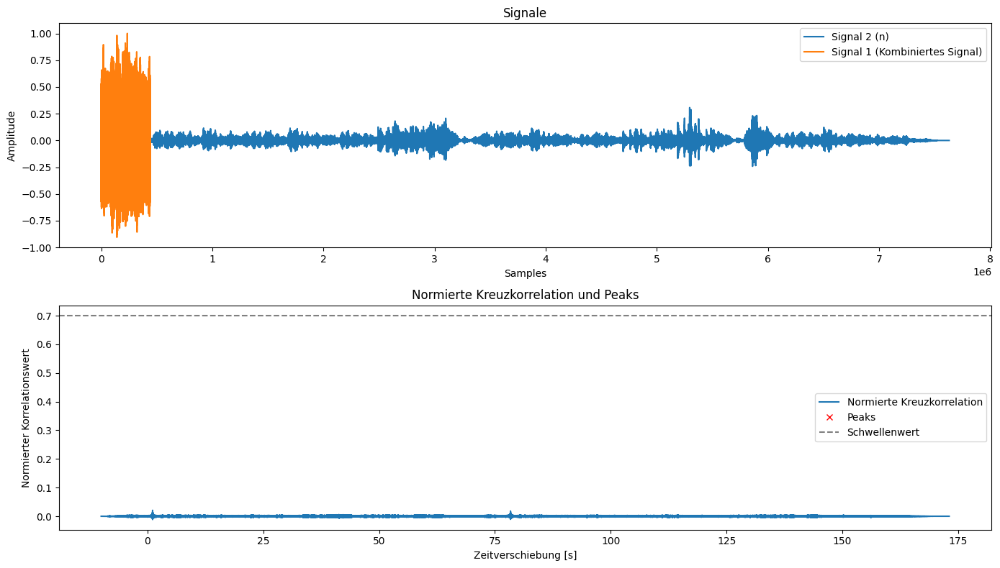

In [11]:
# Normierte Kreuzkorrelation berechnen
corr_ = correlate(n - np.mean(n), combined_signal - np.mean(combined_signal), mode='full') / (np.std(n) * np.std(combined_signal) * len(n))

# Zeitverschiebungen (Lags) berechnen
lags_ = correlation_lags(len(n), len(combined_signal), mode='full')

# Schwellenwert für Peaks setzen
threshold_ = 0.7 

# Peaks finden
samples_per_10s = sr * 5  # Mindestabstand von 5 Sekunden
peaks_, properties_ = find_peaks(corr_, height=threshold_, distance=samples_per_10s)

# Zeitverschiebungen der Peaks berechnen
peak_times = lags_[peaks_] / sr

# Visualisierung
plt.figure(figsize=(14, 8))

# Originalsignal und Muster
plt.subplot(2, 1, 1)
plt.plot(n, label="Signal 2 (n)")
plt.plot(np.arange(0, len(combined_signal)), combined_signal, label="Signal 1 (Kombiniertes Signal)")
plt.legend()
plt.title("Signale")
plt.xlabel("Samples")
plt.ylabel("Amplitude")

# Normierte Kreuzkorrelation
plt.subplot(2, 1, 2)
plt.plot(lags_ / sr, corr_, label="Normierte Kreuzkorrelation")
plt.plot((lags_[peaks_]) / sr, corr_[peaks_], 'rx', label="Peaks")
plt.axhline(y=threshold_, color='gray', linestyle='--', label="Schwellenwert")
plt.xlabel("Zeitverschiebung [s]")
plt.ylabel("Normierter Korrelationswert")
plt.title("Normierte Kreuzkorrelation und Peaks")
plt.legend()

# Layout anpassen und anzeigen
plt.tight_layout()
plt.show()

Durch das Hinzufügen der Begleitakkorde habe ich die grundlegende Struktur des Ausschnitts stark verändert. Zwar bleibt die Melodie akustisch erkennbar, jedoch hat die harmonische Überlagerung die ursprüngliche Struktur des Stücks erheblich verfremdet. Diese Veränderung bewirkt, dass andere Abschnitte des Liedes in ihrer ursprünglichen Form nicht wiedererkennbar sind. Ich habe auch versucht das neue Signal zu normieren, dies hat jedoch ebenfalls nicht funktioneirt.

Im Gegensatz dazu hat Beethoven die Akkorde nicht einfach in gleichbleibender Intensität hinzugefügt. Vielmehr integrierte er sie mit großer Präzision und Feingefühl in die Komposition. Seine Akkorde folgen einer dynamischen und harmonischen Logik, die eine natürliche Balance zwischen Melodie und Begleitung schafft.

Die Art und Weise, wie die Akkorde in meinem Ansatz hinzugefügt wurden, unterscheidet sich grundlegend von Beethovens Methode. Dadurch entsteht eine Struktur, die von der Originalkomposition abweicht und die Charakteristika des Stücks verwässert. Dies führt dazu, dass die Kreuzkorrelation als Analysewerkzeug versagt, da die Beziehung zwischen den Abschnitten nicht mehr auf den gleichen harmonischen und strukturellen Prinzipien basiert.

Um die Methode zu verbessern, wäre es entscheidend, die Akkorde nicht nur rhythmisch und dynamisch anzupassen, sondern sie auch mit der melodischen Bewegung zu synchronisieren.

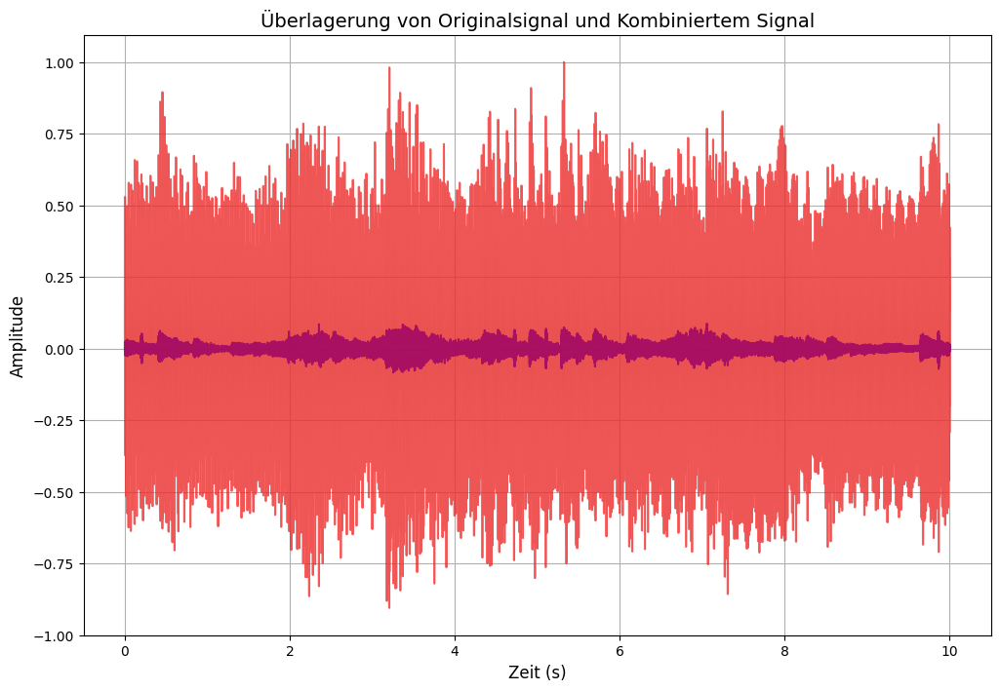

In [12]:
x = np.linspace(0, len(n_part) / sr, len(n_part))  # Zeitachse in Sekunden

# Differenz berechnen
difference = combined_signal - n_part

# Standardabweichung der Differenz
std_difference = np.std(difference)

# Plotten der Signale
plt.figure(figsize=(12, 8))

# Originalsignal
plt.plot(x, n_part, label='Originalsignal (n_part)', color='blue', alpha=0.8)

# Kombiniertes Signal
plt.plot(x, combined_signal, label='Kombiniertes Signal', color='red', alpha=0.6)

# Differenz als Bereich (Transparenz für Übersichtlichkeit)
plt.fill_between(x, n_part, combined_signal, color='gray', alpha=0.3, label='Differenz (combined - n_part)')

# Achsentitel und Legende
plt.title('Überlagerung von Originalsignal und Kombiniertem Signal', fontsize=14)
plt.xlabel('Zeit (s)', fontsize=12)
plt.ylabel('Amplitude', fontsize=12)
plt.grid(True)

# Plot anzeigen
plt.show()

Man erkennt hier bei der Überlappung beider Signale (mit und ohne Begleitakkorde) sehr gut den Unterschied beider Signale. Die Begleitakkorde dominieren das Signal sehr stark, ich hätte besser darauf achten sollen, die Begleitakkorde nicht so stark zu gewichtenb und mehr an die AMplituden des Liedes anzupassen. Dies wird der Grund sein, warum die Kreuzkorrelation hier nicht funktioniert hat.

### Tag 11
Da das einfache hinzufügen der Begleitakkorde nicht so funktioneirt hat, wie ich es mir vorgestellt habe werde ich nun genauer analysieren, bis zu welchem Punkt meine Peaks noch gefunden werden. Ich werde dazu vor allem die Lautstärke der Begleitakkorde anpassen und wie dominnant sie sind. Ich werde also verschiedenen Einstellungen für die Amplitude und Dominanz einstellen und jeweiols die Kreuzkorrelation ausrechnen.

Beste Einstellung:
Amplitudenbereich: (-0.05, 0.05)
Dominanzfaktor: 0.1
Maximale Korrelation: 0.1950


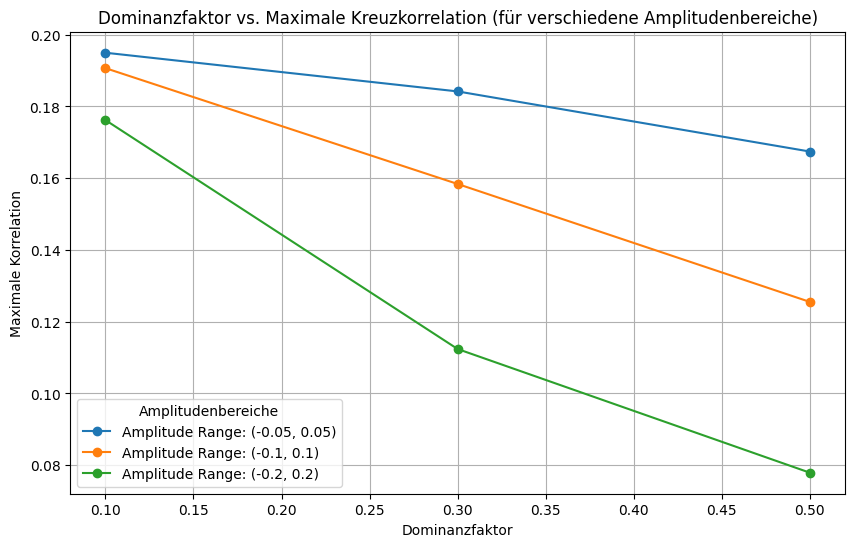

In [13]:
# Funktion zur Erzeugung eines Akkords
def generate_chord(frequencies, duration, samplerate):
    base_chord = sum(generate_tone(freq, duration, samplerate) for freq in frequencies)
    return base_chord

# Funktion zur Berechnung der Kreuzkorrelation
def normalized_cross_correlation(signal1, signal2):
    n = len(signal1)
    corr = np.correlate(signal1, signal2, mode='full')
    corr = corr / (np.linalg.norm(signal1) * np.linalg.norm(signal2))
    return np.max(corr)

# Akkorddefinitionen
chords = {
    "Am": [220.00, 261.63, 329.63],
    "C": [261.63, 329.63, 392.00],
    "E": [329.63, 415.30, 493.88]
}
chord_progression = [
    ("Am", 3),  # Am
    ("C", 3),   # C
    ("E", 4)    # E
]

# Einstellungen testen
amplitude_ranges = [
    (-0.05, 0.05),  # Amplitudenbereich 1
    (-0.1, 0.1),    # Amplitudenbereich 2
    (-0.2, 0.2)     # Amplitudenbereich 3
]
dominance_factors = [0.1, 0.3, 0.5]  # Dominanzfaktoren
results = []

for amplitude_range in amplitude_ranges:
    for dominance in dominance_factors:
        min_amp, max_amp = amplitude_range

        # Generiere Akkordsignal
        chord_signal = np.zeros(len(n_part))
        current_sample = 0

        for chord_name, duration in chord_progression:
            chord = generate_chord(chords[chord_name], duration, sr)
            samples = len(chord)
            if current_sample + samples > len(chord_signal):
                samples = len(chord_signal) - current_sample
            chord_signal[current_sample:current_sample + samples] += chord[:samples]
            current_sample += samples

        # Skaliere Akkorde auf den Amplitudenbereich und Dominanzfaktor
        chord_signal = chord_signal / np.max(np.abs(chord_signal))  # Normiere auf -1 bis 1
        chord_signal = chord_signal * (max_amp - min_amp) / 2 * dominance  # Passe auf Bereich an und skaliere mit Dominanzfaktor
        chord_signal = chord_signal + (max_amp + min_amp) / 2  # Zentriere im Amplitudenbereich

        # Kombiniere mit Originalsignal
        combined_signal = n_part + chord_signal

        # Berechne Kreuzkorrelation
        max_corr = normalized_cross_correlation(n, combined_signal)
        results.append({
            "Amplitude Range": amplitude_range,
            "Dominance": dominance,
            "Max Correlation": max_corr
        })

# Ergebnisse sortieren
results = sorted(results, key=lambda x: x["Max Correlation"], reverse=True)

# Beste Einstellung anzeigen
best_result = results[0]
print("Beste Einstellung:")
print(f"Amplitudenbereich: {best_result['Amplitude Range']}")
print(f"Dominanzfaktor: {best_result['Dominance']}")
print(f"Maximale Korrelation: {best_result['Max Correlation']:.4f}")

# Ergebnisse plotten
results_df = pd.DataFrame(results)

plt.figure(figsize=(10, 6))
for amplitude_range in amplitude_ranges:
    subset = results_df[results_df["Amplitude Range"].apply(lambda x: x == amplitude_range)]
    plt.plot(
        subset["Dominance"],
        subset["Max Correlation"],
        marker='o',
        label=f"Amplitude Range: {amplitude_range}"
    )

plt.title("Dominanzfaktor vs. Maximale Kreuzkorrelation (für verschiedene Amplitudenbereiche)")
plt.xlabel("Dominanzfaktor")
plt.ylabel("Maximale Korrelation")
plt.grid(True)
plt.legend(title="Amplitudenbereiche")
plt.show()

In diesem Plot sieht man die besten Einstellungen für die Amplitude und Dominanz der Begleitakkorde, um immernoch einen guten Korrelationswert zu haben. Die maximale Korrelation von 0.9173 ist der Originale Auschnitt, was bedeutet, dass sich diese beiden Signale jetzt relativ ähnlich sind, sodass die anderen Peaks auch noch gefunden werden.
Ich werde nun noch die Peaks genauer untersuchen und anhören.

In [18]:
# Das Signal mit der besten Einstellung erzeugen und anzeigen
best_amplitude_range = best_result["Amplitude Range"]
best_dominance = best_result["Dominance"]
min_amp, max_amp = best_amplitude_range

# Generiere Akkordsignal mit der besten Einstellung
chord_signal = np.zeros(len(n_part))
current_sample = 0

for chord_name, duration in chord_progression:
    chord = generate_chord(chords[chord_name], duration, sr)
    samples = len(chord)
    if current_sample + samples > len(chord_signal):
        samples = len(chord_signal) - current_sample
    chord_signal[current_sample:current_sample + samples] += chord[:samples]
    current_sample += samples

# Skaliere Akkorde auf den besten Amplitudenbereich und Dominanzfaktor
chord_signal = chord_signal * (max_amp - min_amp) / 2 * best_dominance  # Passe auf Bereich an und skaliere mit Dominanzfaktor
chord_signal = chord_signal + (max_amp + min_amp) / 2  # Zentriere im Amplitudenbereich

# Kombiniere mit Originalsignal
final_signal = n_part + chord_signal

# Audioausgabe
print("Originalsignal (n_part):")
display(Audio(n_part, rate=sr))

print("Kombiniertes Signal (final_signal):")
display(Audio(final_signal, rate=sr))

Originalsignal (n_part):


Kombiniertes Signal (final_signal):


akkustisch hören sich die beiden Signale gleich an, ich schaue mir noch die Struktur genauer an, um zu schauen ob das Signal auch richtig bearbeitet wurde.

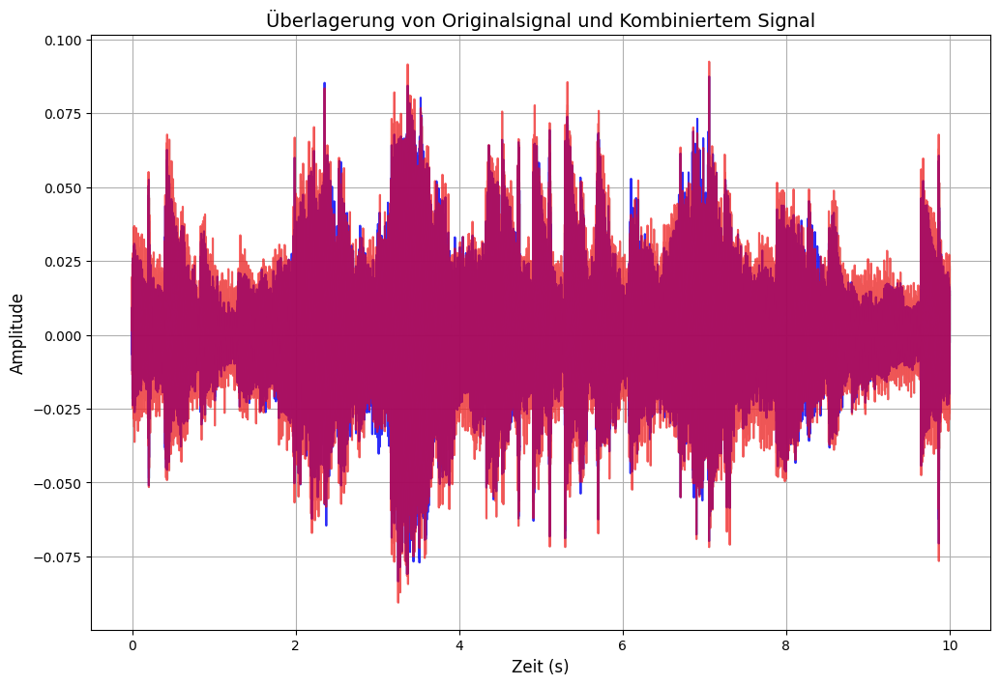

In [19]:
x = np.linspace(0, len(n_part) / sr, len(n_part))  # Zeitachse in Sekunden

# Differenz berechnen
difference = final_signal - n_part

# Standardabweichung der Differenz
std_difference = np.std(difference)

# Plotten der Signale
plt.figure(figsize=(12, 8))

# Originalsignal
plt.plot(x, n_part, label='Originalsignal (n_part)', color='blue', alpha=0.8)

# Kombiniertes Signal
plt.plot(x, final_signal, label='Kombiniertes Signal', color='red', alpha=0.6)

# Differenz als Bereich (Transparenz für Übersichtlichkeit)
plt.fill_between(x, n_part, final_signal, color='gray', alpha=0.3, label='Differenz (combined - n_part)')

# Achsentitel und Legende
plt.title('Überlagerung von Originalsignal und Kombiniertem Signal', fontsize=14)
plt.xlabel('Zeit (s)', fontsize=12)
plt.ylabel('Amplitude', fontsize=12)
plt.grid(True)

# Plot anzeigen
plt.show()

Das Hinzufügen der Begleitakkorde war erfolgreich, was deutlich an der veränderten Struktur des Signals zu erkennen ist. Es sind leider keine grossen Änderungen, denn die Korrrelation nimmt sehr stark ab, sobald ich die Dominanz leicht erhöhe. Ich werde nun schauen, welche Peaks mit demn neuen Signal gefunden wurden und wie gut diese sind.

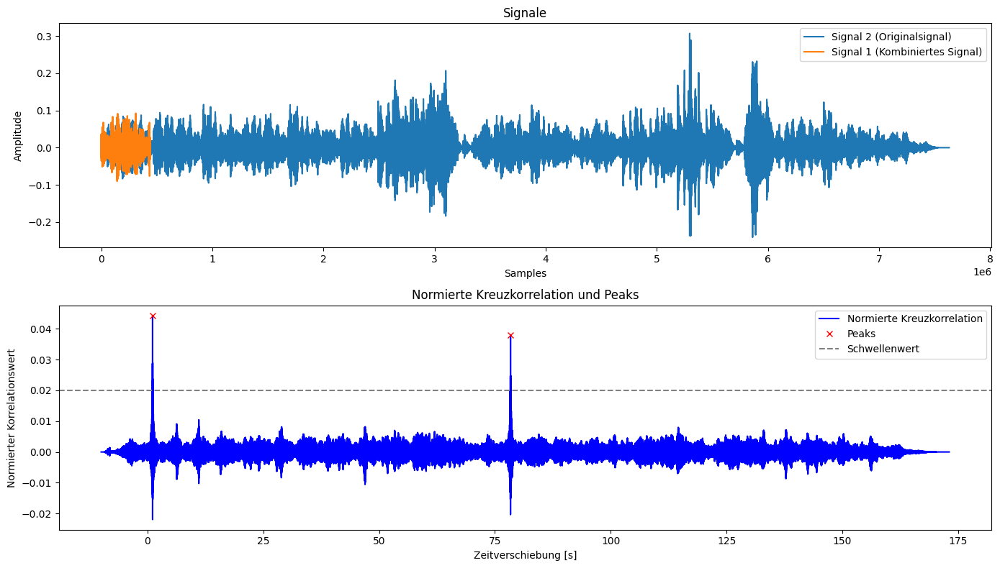

Gefundene Peaks (Zeit in Sekunden): [ 1.09977324 78.36310658]
Korrelationswerte der Peaks: [0.04427267 0.03806076]


In [23]:
# Berechnung der normierten Kreuzkorrelation
corr = np.correlate(n - np.mean(n), final_signal - np.mean(final_signal), mode='full') / (np.std(n) * np.std(final_signal) * len(n))

# Zeitverschiebungen (Lags) berechnen
lags_ = correlation_lags(len(n), len(final_signal), mode='full')

# Schwellenwert für Peaks setzen
threshold_ = 0.02

# Peaks in der Kreuzkorrelation finden
samples_per_10s = sr * 5  # Mindestabstand von 5 Sekunden zwischen Peaks
peaks_, properties_ = find_peaks(corr, height=threshold_, distance=samples_per_10s)

# Zeitverschiebungen der Peaks berechnen
peak_times = lags_[peaks_] / sr

# Visualisierung
plt.figure(figsize=(14, 8))

# Originalsignal und Final Signal
plt.subplot(2, 1, 1)
plt.plot(n, label="Signal 2 (Originalsignal)")
plt.plot(np.arange(0, len(final_signal)), final_signal, label="Signal 1 (Kombiniertes Signal)")
plt.legend()
plt.title("Signale")
plt.xlabel("Samples")
plt.ylabel("Amplitude")

# Normierte Kreuzkorrelation und Peaks
plt.subplot(2, 1, 2)
plt.plot(lags_ / sr, corr, label="Normierte Kreuzkorrelation", color='blue')
plt.plot((lags_[peaks_]) / sr, corr[peaks_], 'rx', label="Peaks")
plt.axhline(y=threshold_, color='gray', linestyle='--', label="Schwellenwert")
plt.xlabel("Zeitverschiebung [s]")
plt.ylabel("Normierter Korrelationswert")
plt.title("Normierte Kreuzkorrelation und Peaks")
plt.legend()

# Layout anpassen und anzeigen
plt.tight_layout()
plt.show()

# Ergebnisse ausgeben
print(f"Gefundene Peaks (Zeit in Sekunden): {peak_times}")
print(f"Korrelationswerte der Peaks: {corr[peaks_]}")

In [24]:
# Abspielen der Peaks
seconds_before_peak = 2  # 2 Sekunden vor dem Peak
seconds_after_peak = 10  # 10 Sekunden nach dem Peak

# Muster-Signal (final_signal) abspielen
samples_before = int(seconds_before_peak * sr)
samples_after = int(seconds_after_peak * sr)

# Start- und Endindex für den erweiterten Bereich berechnen
start_index = max(0, 48500 - samples_before)
end_index = min(len(n), 48500 + 44100 + samples_after)

# Erweiterten Bereich extrahieren
final_signal_extended = n[start_index:end_index]

# Abspielen des erweiterten Signals
print(f"Abspielen von final_signal mit 2 Sekunden vorher und 10 Sekunden nachher:")
display(Audio(final_signal_extended, rate=sr))  # Hier wird final_signal als dein Vergleichssignal abgespielt

# Peaks bearbeiten
for i, peak in enumerate(peaks_):
    # Sample-Bereiche berechnen
    start_sample = max(0, peak - seconds_before_peak * sr)
    end_sample = min(len(n), peak + seconds_after_peak * sr)

    # Signalbereich extrahieren
    extracted_signal = n[start_sample:end_sample]

    print(f"\nWiedergabe von Segment {i+1}:")
    display(Audio(extracted_signal, rate=sr))

Abspielen von final_signal mit 2 Sekunden vorher und 10 Sekunden nachher:



Wiedergabe von Segment 1:



Wiedergabe von Segment 2:


Ich konnte mit dem neuen Signal zwei Peaks identifizieren, die akustisch ebenfalls korrekt erscheinen. Allerdings musste ich die Begleitakkorde so subtil in das Signal integrieren, dass sie kaum noch hörbar sind. Dies war notwendig, da die Kreuzkorrelation bei stärker wahrnehmbaren Akkorden erhebliche Schwierigkeiten hat, die Peaks zuverlässig zu finden. Wenn die Begleitakkorde dominanter in das Signal eingebaut werden, überlagern sie die Struktur des Originals, was dazu führt, dass die Kreuzkorrelation keine Peaks mehr identifizieren kann.

### Tag 12

Mein Ziel war es, herauszufinden, wie oft die berühmte Anfangssequenz des Liedes Für Elise im gesamten Stück vorkommt. Dazu habe ich die Anfangssequenz extrahiert und versucht, diese mithilfe der Kreuzkorrelation im Lied wiederzufinden. Beim Anhören des Liedes konnte ich akustisch fünf Wiederholungen der Sequenz identifizieren. Die Kreuzkorrelation ergab zunächst drei Peaks, die potenziell mit den Sequenzen übereinstimmen könnten. Nachdem ich das Lied normiert hatte, konnte ich vier Peaks erkennen, von denen drei unterschiedlich zu den vorherigen Peaks waren. Allerdings stellte sich heraus, dass der letzte Peak akustisch nicht zur ursprünglichen Sequenz passt. Dies konnte auch durch die Überlagerung der Signale im entsprechenden Bereich visuell bestätigt werden.

Da ich selbst keine umfassenden Kenntnisse in der Musiktheorie habe, habe ich die Noten der Sequenzen analysiert und konnte ebenfalls fünf Sequenzen identifizieren. Interessanterweise befindet sich die fünfte Sequenz, anders als erwartet, nicht am Ende des Liedes, sondern stimmt mit dem Bereich des normierten Signals überein, an dem der vierte Peak gefunden wurde. Dies könnte erklären, warum dieser Peak erkannt wurde, obwohl er akustisch nicht zur Sequenz zu passen scheint.

Die Sequenz im Lied wiederholt sich zwar mehrfach, wird aber jedes Mal leicht variiert. Um die Erkennung der Peaks durch die Kreuzkorrelation zu verbessern, habe ich versucht, die Sequenz harmonisch zu verändern, indem ich Begleitakkorde hinzugefügt habe. Leider reagiert die Kreuzkorrelation äußerst empfindlich auf diese Ergänzungen, sodass ich die Begleitakkorde sehr subtil einfügen musste, um überhaupt noch Peaks zu identifizieren. Nach genauer Analyse der Peaks konnte ich zwei finden, die akustisch mit der Sequenz übereinstimmen. Dennoch verändern die Begleitakkorde die Struktur des Signals so stark, dass sie für die Kreuzkorrelation ungeeignet erscheinen. Dies macht es schwierig, zuverlässige Ergebnisse mit dieser Methode zu erzielen.

Insgesamt kann ich aber festhalten, dass mein Freund recht hatte mit seiner Annahme, dass das Stück sehr komplex ist und ich konnte viel über das wunderschöne Stück Für Elise lernen.

(mit ChatGPT bearbeitet)